# Generating Images of Dogs with GAN

Importing necessary libraries

In [1]:
import pandas as pd
import numpy as np
import os 
import cv2 
import time
import pickle
import matplotlib.pyplot as plt
from PIL import Image

import xml.etree.ElementTree as ET 

import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Conv2D, Flatten, Conv2DTranspose
from tensorflow.keras.layers import BatchNormalization,LeakyReLU, Reshape, Dropout
from tensorflow.keras.losses import BinaryCrossentropy
from tensorflow.keras.optimizers import Adam



## Loading Generative Dogs Dataset


In [2]:
'''
img_arr = np.zeros((m,img_size,img_size,3))

i = 0

for breed in os.listdir('Data/Annotation/'):
    if breed.startswith('n'):
        for name in os.listdir('Data/Annotation/'+breed):

            filename = name
            
            try: img=Image.open('Data/all-dogs/'+filename+'.jpg')        
            except: continue
                
            tree=ET.parse('Data/Annotation/'+breed+'/'+filename)
            root = tree.getroot()
            obj = root.findall('object')

            for o in obj:
                bndbox = o.find('bndbox') 

                xmin = int(bndbox.find('xmin').text)
                ymin = int(bndbox.find('ymin').text)

                xmax = int(bndbox.find('xmax').text)
                ymax = int(bndbox.find('ymax').text)

                w = min(xmax-xmin, ymax-ymin)

            img = img.crop((xmin, ymin, xmin+w, ymin+w))        
            img = img.resize((img_size,img_size))
            img = np.asarray(img)
            img_arr[i,:,:,:] = img
            i+=1
            
img_arr = img_arr.astype('uint8')
np.save('Data/Output/cropped_images.npy', img_arr)
'''

"\nimg_arr = np.zeros((m,img_size,img_size,3))\n\ni = 0\n\nfor breed in os.listdir('Data/Annotation/'):\n    if breed.startswith('n'):\n        for name in os.listdir('Data/Annotation/'+breed):\n\n            filename = name\n            \n            try: img=Image.open('Data/all-dogs/'+filename+'.jpg')        \n            except: continue\n                \n            tree=ET.parse('Data/Annotation/'+breed+'/'+filename)\n            root = tree.getroot()\n            obj = root.findall('object')\n\n            for o in obj:\n                bndbox = o.find('bndbox') \n\n                xmin = int(bndbox.find('xmin').text)\n                ymin = int(bndbox.find('ymin').text)\n\n                xmax = int(bndbox.find('xmax').text)\n                ymax = int(bndbox.find('ymax').text)\n\n                w = min(xmax-xmin, ymax-ymin)\n\n            img = img.crop((xmin, ymin, xmin+w, ymin+w))        \n            img = img.resize((img_size,img_size))\n            img = np.asarray(img)

In [3]:
img_arr=np.load('Data/Output/cropped_images.npy')

In [4]:
# Defining some parameters that will come in handy in this notebook.
m = len(img_arr)
img_size = 64
noise_dim = 100

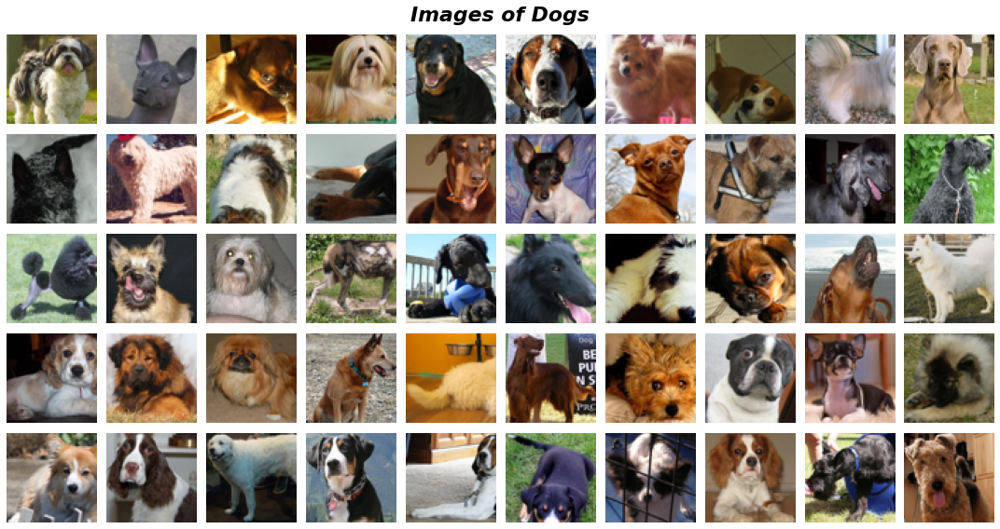

In [5]:
# visualizing the images of Traffic Signs
plt.figure(figsize=(15,8))
plt.suptitle('Images of Dogs', fontsize=22, 
             fontweight='bold', fontstyle='italic')

for i in range(50):
    plt.subplot(5,10,i+1)
    ind_ = np.random.randint(0,m)
    plt.imshow(img_arr[ind_])
    plt.axis('off')
    plt.tight_layout()

Since it is recommended to use hyperbolic tangent activation function as the output from the generator model, we'll have to normalize the pixel values of the image, i.e scale images to the range [-1,1]

In [6]:
norm_img = (img_arr-127.5)/127.5

In [7]:
# gradient functions from TF require float32 instead of float64
img_tensors = tf.cast(norm_img, 'float32')

Save data in a tensorflow-compatible format.

In [8]:
buffer = 20000
batch_size = 32

data = tf.data.Dataset.from_tensor_slices(img_tensors).shuffle(buffer).batch(batch_size)

## Define Generative Adverserial Network (GAN)

Generative adversarial networks is made up of two models: a generative model and a discriminative model.
    
The discriminator model is a classifier that determines whether a given image resembles a real image from the dataset or an image that was created artificially. This is essentially a binary classifier.
The generator model uses a deconvolutional neural network to transform random input values into images.

Backpropagation is used to train the discriminator and generator's weights and biases over a large number of iterations. The discriminator learns to differentiate between "real" and "false" images generated by the generator. Simultaneously, the generator learns from the discriminator's feedback how to create convincing images that the discriminator is unable to distinguish from genuine ones.



#### Initializing weights
Before training the GAN, the model parameters must be initialized to some random values. I will  initialize all parameters using a zero-centered Gaussian distribution with a standard deviation of 0.02.

In [9]:
# weight initializers for the generator network
initializer = tf.keras.initializers.RandomNormal(mean=0.0, stddev=0.2)

### Generator
Generator is a reverse CNN. It takes a d-dimensional noise vector and upsamples it to a 64 x 64 x 3 image. To stabilise the outputs of each layer, leaky ReLU and batch normalisation are used.

In [10]:
def define_generator():

    model = Sequential()
    model.add(Dense(8*8*512, use_bias=False, input_shape=(noise_dim,) ))
    # Batch normalization will have the activations from the prior layer zero mean and unit variance.
    model.add(BatchNormalization())
    model.add(LeakyReLU())
    model.add(Reshape((8,8,512)))
    
    f = [256,128]

    for filter_ in f:
        model.add(Conv2DTranspose(filters=filter_, kernel_size=(5,5), strides=(2,2), padding='same',
                                 use_bias=False, kernel_initializer=initializer))
        model.add(BatchNormalization())
        model.add(LeakyReLU())
        model.add(Dropout(0.3))
    
    model.add(Conv2DTranspose(filters=64, kernel_size=(5,5), strides=(2,2), padding='same',
                                 use_bias=False, kernel_initializer=initializer))
    model.add(BatchNormalization())
    model.add(LeakyReLU())
    
    model.add(Dense(3, activation='tanh', use_bias=False, kernel_initializer=initializer))
    return model




                  

In [11]:
# create an instance of the generator model defined
generator = define_generator()
print(generator.summary())


Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 32768)             3276800   
_________________________________________________________________
batch_normalization (BatchNo (None, 32768)             131072    
_________________________________________________________________
leaky_re_lu (LeakyReLU)      (None, 32768)             0         
_________________________________________________________________
reshape (Reshape)            (None, 8, 8, 512)         0         
_________________________________________________________________
conv2d_transpose (Conv2DTran (None, 16, 16, 256)       3276800   
_________________________________________________________________
batch_normalization_1 (Batch (None, 16, 16, 256)       1024      
_________________________________________________________________
leaky_re_lu_1 (LeakyReLU)    (None, 16, 16, 256)       0

2022-02-01 10:02:08.966007: I tensorflow/stream_executor/cuda/cuda_dnn.cc:369] Loaded cuDNN version 8005


(1, 64, 64, 3)


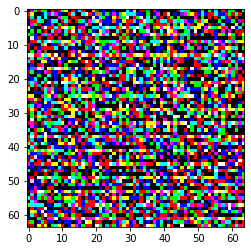

In [12]:
noise = tf.random.normal([1,noise_dim])

# run the generator model with the noise vector as input
generated_image = generator(noise, training=False)
# display output
plt.imshow(generated_image[0])
print(generated_image.shape)


### Discriminator
Discriminator is a CNN that takes an image of size 64 x 64 x 3 as input and returns a output indicating whether the image is "real" or "fake".

In [13]:
def define_discriminator():
    model = Sequential()
    
    model.add(Conv2D(filters=64, kernel_size=(4,4), strides=(2,2),
                     padding='same', input_shape=[img_size,img_size,3], kernel_initializer=initializer))
    
    model.add(BatchNormalization())
    model.add(LeakyReLU())
    
    f = [128,256]
    for filter_ in f:
        model.add(Conv2D(filters=filter_, kernel_size=(4,4), strides=(2,2),
                 padding='same', kernel_initializer=initializer))

        model.add(BatchNormalization())
        model.add(LeakyReLU())
    
    model.add(Flatten())
    model.add(Dense(1, activation='sigmoid'))
    
    return model



In [14]:
# create an instance of the discriminator model defined
discriminator = define_discriminator()
print(discriminator.summary())

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 32, 32, 64)        3136      
_________________________________________________________________
batch_normalization_4 (Batch (None, 32, 32, 64)        256       
_________________________________________________________________
leaky_re_lu_4 (LeakyReLU)    (None, 32, 32, 64)        0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 16, 16, 128)       131200    
_________________________________________________________________
batch_normalization_5 (Batch (None, 16, 16, 128)       512       
_________________________________________________________________
leaky_re_lu_5 (LeakyReLU)    (None, 16, 16, 128)       0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 8, 8, 256)        

In [15]:
output = discriminator(generated_image)
print(output)

tf.Tensor([[1.]], shape=(1, 1), dtype=float32)


### Few Regularization Techniques

#### Label smoothing

We will assign random integers as class labels instead of 1/0. This will potentially prevent overfitting by lowering model confidence.

In [16]:
def smooth_posY(y):
    '''uniformly smoothing the positive label values into the range [0.7, 1.0]'''
    
    np.random.seed(0)
    return y - 0.3 + (np.random.random(y.shape) * 0.3)


def smooth_negY(y):
    '''uniformly smoothing the negative label values into the range [0.0, 0.5]'''
    
    np.random.seed(0)
    return y + (np.random.random(y.shape) * 0.5)

#### Adding noise to labels
Introducing errors to some labels at random, so that some fake images are marked as real and some real images are marked as fake

In [17]:
def add_noise(y, prob):
    y = y.numpy()
    
    # determine the number of labels to add noise to.
    n = int(prob * y.shape[0])
    
    # randomly getting n indices to add noise
    np.random.seed(0)
    noise_idx = np.random.choice(y.shape[0], size=n)
    
    # adding noise
    y[noise_idx] = 1 - y[noise_idx]
    return tf.convert_to_tensor(y)

#### Loss Function

The loss function of discriminator will compute loss for both real and fake images and then output the total loss as the sum of the two. Meanwhile, generator will only compute cross entropy loss for fake images.

In [18]:
# a helper function for calculating cross-entropy loss
cost = BinaryCrossentropy(from_logits=False)


def discriminator_loss(real_pred, fake_pred):
    '''Discriminator will be penalised if it is unable to distinguish between real and fake images.'''  
    
    real_orig = tf.ones_like((real_pred))
    real_orig = smooth_posY(real_orig) 
#     real_orig = add_noise(real_orig, 0.05)
    real_loss = cost(real_orig, real_pred)
    
    fake_orig = tf.zeros_like((fake_pred))
    fake_orig = smooth_negY(fake_orig)
#     fake_orig = add_noise(fake_orig, 0.05)
    fake_loss = cost(fake_orig, fake_pred)
    
    return real_loss+fake_loss


def generator_loss(fake_pred):
    '''Generator will be penalized if it is unable to deceive the discriminator.'''
    
    fake_orig = tf.ones_like((fake_pred))
    fake_orig = smooth_negY(fake_orig)
#     fake_orig = add_noise(fake_orig, 0.05)
    return cost(fake_orig, fake_pred)

## Training loop
- Generate noise of 100 dimensions.
- Feed the noise into the generator to get the generated image. 
- Run the generated image and the real image through the discriminator to determine whether the image is fake or     real. 
- Calculate the loss for both the discriminator and the generator 
- Calculate the derivative using the above-mentioned losses, and thereafter apply the gradients.

In [19]:
def optimizer():
    ''' helper function for adam optimizer '''
  
    return Adam(learning_rate=0.0002, beta_1=0.5)


def apply_grads(model, tape, opt, loss):
        
    '''The derivatives are calculated and gradients are applied 
    using the Adam optimizer in the following lines of code.'''
    
    gradients = tape.gradient(loss, model.trainable_variables)
    opt.apply_gradients(zip(gradients, model.trainable_variables))

In [20]:
## initiate the instances of both generator and discriminator
generator = define_generator()
discriminator = define_discriminator()

## define adam optimizer for generator and discriminator
gen_optimizer = optimizer()
disc_optimizer = optimizer()

In [21]:
def train_batch(img_batch, gen_loss_list, disc_loss_list):
    
    # generate noise of 100 dimensions
    noise = tf.random.normal([batch_size, noise_dim])
    
    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        gen_img = generator(noise, training=True)
        
        real_pred = discriminator(img_batch, training=True)
        fake_pred = discriminator(gen_img, training=True)
        
        disc_loss = discriminator_loss(real_pred, fake_pred)
        gen_loss = generator_loss(fake_pred)
        
    gen_loss_list.append(gen_loss.numpy())
    disc_loss_list.append(disc_loss.numpy())

    
    apply_grads(generator, gen_tape, gen_optimizer, gen_loss)
    apply_grads(discriminator, disc_tape, disc_optimizer, disc_loss)


In [24]:
def train_GAN(data, epochs):
    gen_loss_list = []
    disc_loss_list = []

    for epoch in range(epochs):
        start = time.time()

        for img_batch in data:
            train_batch(img_batch, gen_loss_list, disc_loss_list)
            
        g_loss = sum(gen_loss_list)/len(gen_loss_list)
        d_loss = sum(disc_loss_list)/len(disc_loss_list)
        print(f'Epoch {epoch+1}, gen loss = {g_loss}, disc loss = {d_loss}')

        if epoch % 10 == 0:
            
            plot_loss(gen_loss_list, disc_loss_list, epoch)
            generate_images(12, generator)
        
        end = time.time()
        total = end-start
        print (f'Time for epoch# {epoch} is {total} sec.')

        gen_loss_list = []
        disc_loss_list = [] 

## Evaluate the performance of GAN

Lastly, we define some functions to plot the images to show how the training progressed, as well as one to plot the loss during training.

In [23]:
def plot_loss(gloss, dloss, epoch):
    
    '''plot loss for both generator and discriminator'''
    plt.figure(figsize=(12,5))
    plt.title(f'Generator and Discriminator loss for epoch# {epoch}')
    plt.plot(gloss, label='Generator Loss')
    plt.plot(dloss, label='Discriminator Loss') 
    plt.ylabel('loss')
    plt.xlabel('iterations')
    plt.legend()
    plt.show()
    
def generate_images(n_test, gen_model):
    
    '''Generate 12 images to validate the generator's performance.'''
    test_input = tf.random.normal([n_test,noise_dim])
    img_preds = gen_model(test_input, training=False)
    plt.figure(figsize=(12,6))
    for i in range(n_test):
        plt.subplot(4,3,i+1)
        img = (img_preds[i].numpy()*127.5)+127.5
        plt.imshow(img.astype('uint8'))
        plt.axis('off')
    plt.show()  


## Training the GAN

2022-02-01 10:03:39.893432: W tensorflow/core/framework/cpu_allocator_impl.cc:80] Allocation of 1011499008 exceeds 10% of free system memory.


Epoch 1, gen loss = 1.1960335735879515, disc loss = 1.1933256582073544


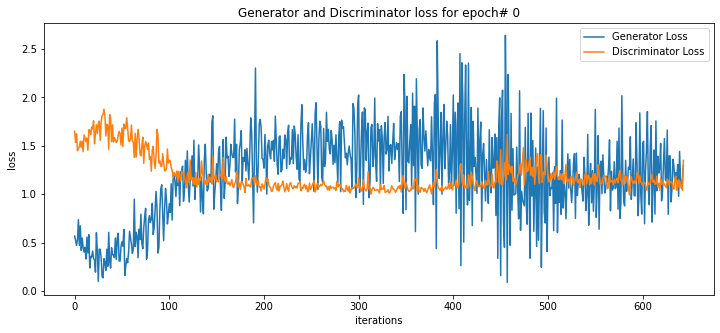

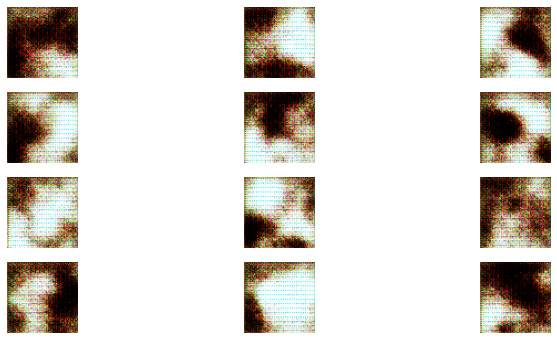

Time for epoch# 0 is 63.40831995010376 sec.


2022-02-01 10:04:43.295098: W tensorflow/core/framework/cpu_allocator_impl.cc:80] Allocation of 1011499008 exceeds 10% of free system memory.


Epoch 2, gen loss = 1.1269341694387776, disc loss = 1.1482355407676341
Time for epoch# 1 is 82.85655641555786 sec.


2022-02-01 10:06:06.152054: W tensorflow/core/framework/cpu_allocator_impl.cc:80] Allocation of 1011499008 exceeds 10% of free system memory.


Epoch 3, gen loss = 0.7866115432336741, disc loss = 1.2681336332552182
Time for epoch# 2 is 62.62841534614563 sec.
Epoch 4, gen loss = 0.7679515391969995, disc loss = 1.2724846497825955
Time for epoch# 3 is 62.94233012199402 sec.
Epoch 5, gen loss = 0.4758626978832835, disc loss = 1.4408113299319463
Time for epoch# 4 is 62.22141242027283 sec.
Epoch 6, gen loss = 0.4307863916623296, disc loss = 1.4403459831424381
Time for epoch# 5 is 62.22052049636841 sec.
Epoch 7, gen loss = 0.4658077662081822, disc loss = 1.4010886914611602
Time for epoch# 6 is 62.06463098526001 sec.
Epoch 8, gen loss = 0.49001344078168363, disc loss = 1.382402616443101
Time for epoch# 7 is 62.562443017959595 sec.
Epoch 9, gen loss = 0.49841588254300706, disc loss = 1.376775951118943
Time for epoch# 8 is 61.920419216156006 sec.
Epoch 10, gen loss = 0.4769349693326476, disc loss = 1.3920306609654278
Time for epoch# 9 is 62.35219144821167 sec.
Epoch 11, gen loss = 0.47736599518460515, disc loss = 1.3911753707790968


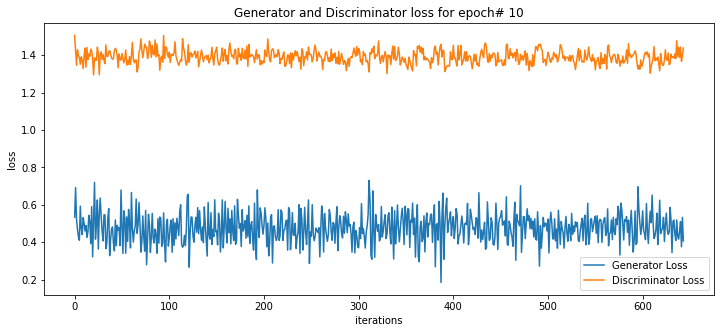

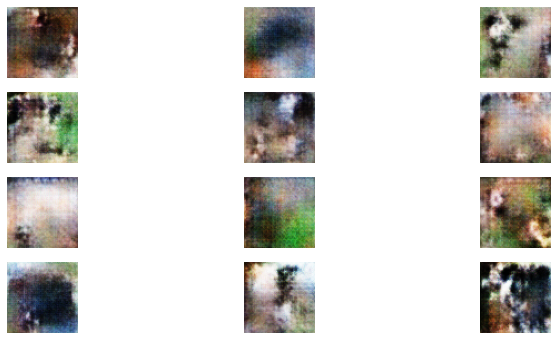

Time for epoch# 10 is 63.34941267967224 sec.
Epoch 12, gen loss = 0.4878923432056948, disc loss = 1.3839823035349756
Time for epoch# 11 is 62.28770732879639 sec.
Epoch 13, gen loss = 0.4857381057942876, disc loss = 1.3812732755767634
Time for epoch# 12 is 62.30108046531677 sec.
Epoch 14, gen loss = 0.4915643558831689, disc loss = 1.3771442480339027
Time for epoch# 13 is 62.43063139915466 sec.
Epoch 15, gen loss = 0.49232071295658253, disc loss = 1.3753815500632576
Time for epoch# 14 is 62.18852758407593 sec.
Epoch 16, gen loss = 0.4927438967253851, disc loss = 1.3766726881080533
Time for epoch# 15 is 62.36601185798645 sec.
Epoch 17, gen loss = 0.48934290266555286, disc loss = 1.3776381049096955
Time for epoch# 16 is 62.517141819000244 sec.
Epoch 18, gen loss = 0.490228047744828, disc loss = 1.3761236167842557
Time for epoch# 17 is 82.8446409702301 sec.
Epoch 19, gen loss = 0.48821644286006133, disc loss = 1.3759073528073589
Time for epoch# 18 is 61.80674147605896 sec.
Epoch 20, gen los

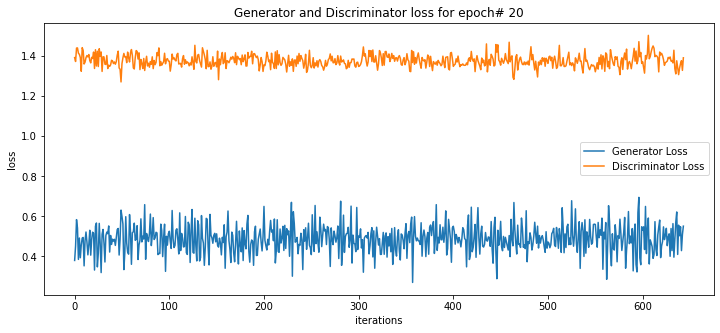

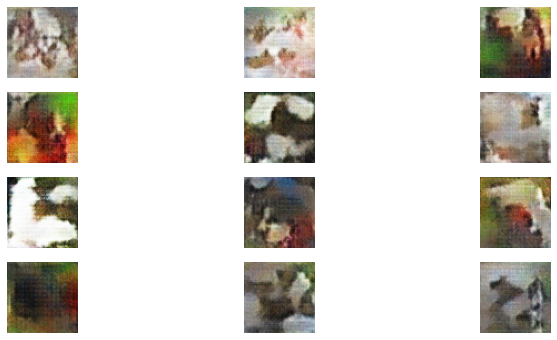

Time for epoch# 20 is 62.617855072021484 sec.
Epoch 22, gen loss = 0.4881918630244569, disc loss = 1.3726340289811911
Time for epoch# 21 is 62.454901456832886 sec.
Epoch 23, gen loss = 0.5031378038273835, disc loss = 1.3640509371801932
Time for epoch# 22 is 62.659910678863525 sec.
Epoch 24, gen loss = 0.5114911745608963, disc loss = 1.3591480634597517
Time for epoch# 23 is 61.899115562438965 sec.
Epoch 25, gen loss = 0.511517639763607, disc loss = 1.3612768148413357
Time for epoch# 24 is 61.77187132835388 sec.
Epoch 26, gen loss = 0.52111113140857, disc loss = 1.3581900250467454
Time for epoch# 25 is 61.71985936164856 sec.
Epoch 27, gen loss = 0.5193084139400017, disc loss = 1.355735835451517
Time for epoch# 26 is 61.8419189453125 sec.
Epoch 28, gen loss = 0.5240713109187087, disc loss = 1.3527504851729233
Time for epoch# 27 is 61.55785870552063 sec.
Epoch 29, gen loss = 0.5285706004093152, disc loss = 1.3486529531315987
Time for epoch# 28 is 61.850231885910034 sec.
Epoch 30, gen loss 

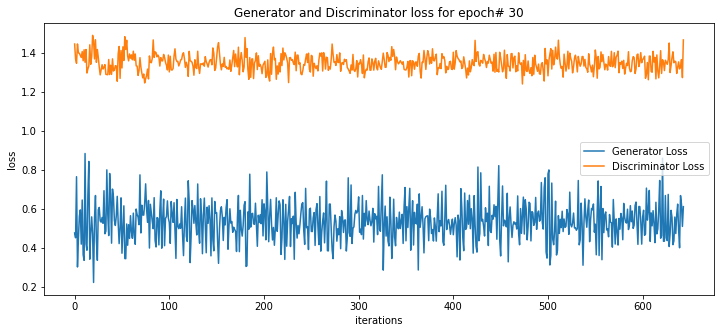

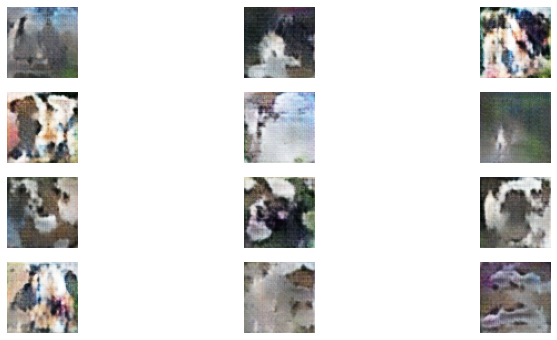

Time for epoch# 30 is 62.35191059112549 sec.
Epoch 32, gen loss = 0.5375305371162313, disc loss = 1.3462933970164068
Time for epoch# 31 is 61.87761616706848 sec.
Epoch 33, gen loss = 0.5371056521623772, disc loss = 1.3470017939620877
Time for epoch# 32 is 61.910707235336304 sec.
Epoch 34, gen loss = 0.5400459157846729, disc loss = 1.3452250155973138
Time for epoch# 33 is 61.89553380012512 sec.
Epoch 35, gen loss = 0.5515106419182342, disc loss = 1.339671625668958
Time for epoch# 34 is 61.91797590255737 sec.
Epoch 36, gen loss = 0.5634656232428847, disc loss = 1.3346915774463868
Time for epoch# 35 is 82.84861922264099 sec.
Epoch 37, gen loss = 0.5738194756765173, disc loss = 1.3317160145466371
Time for epoch# 36 is 61.70685029029846 sec.
Epoch 38, gen loss = 0.5789579186640588, disc loss = 1.3284703730056004
Time for epoch# 37 is 61.7838933467865 sec.
Epoch 39, gen loss = 0.5837977246514389, disc loss = 1.3251891767386323
Time for epoch# 38 is 61.427380323410034 sec.
Epoch 40, gen loss 

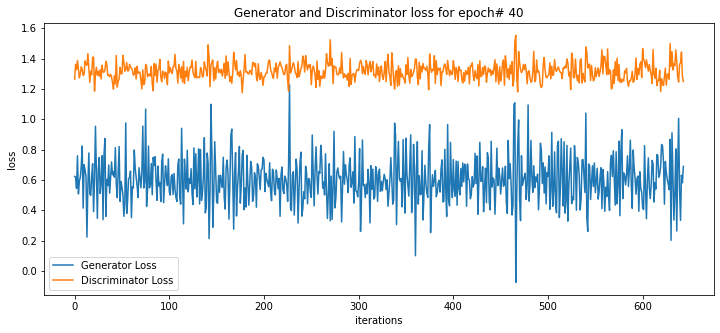

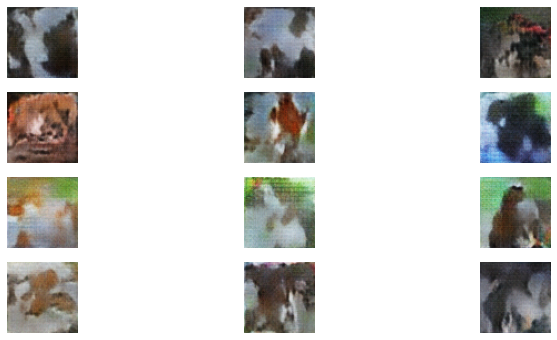

Time for epoch# 40 is 83.73136043548584 sec.
Epoch 42, gen loss = 0.6125982997719175, disc loss = 1.3121079256445725
Time for epoch# 41 is 62.069761991500854 sec.
Epoch 43, gen loss = 0.6221373746842609, disc loss = 1.308095488674152
Time for epoch# 42 is 61.863667011260986 sec.
Epoch 44, gen loss = 0.6242069945618602, disc loss = 1.3081643648029113
Time for epoch# 43 is 61.507160902023315 sec.
Epoch 45, gen loss = 0.6360435032326243, disc loss = 1.3007628310541188
Time for epoch# 44 is 61.71650290489197 sec.
Epoch 46, gen loss = 0.6391392085030212, disc loss = 1.2999817616080644
Time for epoch# 45 is 61.92948889732361 sec.
Epoch 47, gen loss = 0.6550294064818332, disc loss = 1.2946948144376649
Time for epoch# 46 is 61.87638068199158 sec.
Epoch 48, gen loss = 0.6623536451019764, disc loss = 1.2948454625858283
Time for epoch# 47 is 61.812198877334595 sec.
Epoch 49, gen loss = 0.6686018342325776, disc loss = 1.2882381016793458
Time for epoch# 48 is 61.50970697402954 sec.
Epoch 50, gen lo

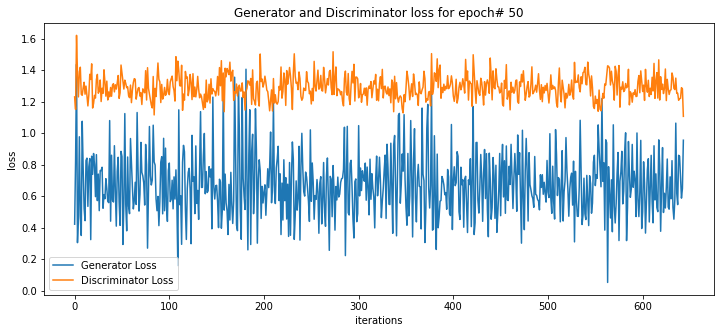

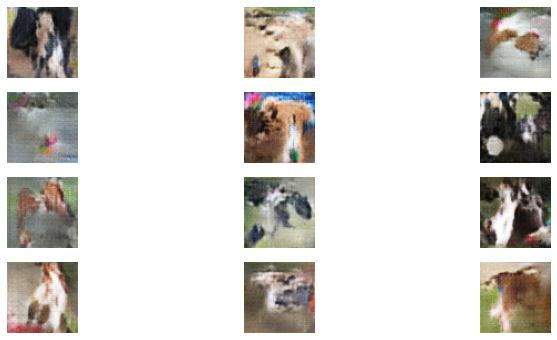

Time for epoch# 50 is 62.81206965446472 sec.
Epoch 52, gen loss = 0.6708031196309172, disc loss = 1.291320434268217
Time for epoch# 51 is 62.380216121673584 sec.
Epoch 53, gen loss = 0.677812020508399, disc loss = 1.2912507618065947
Time for epoch# 52 is 62.01206398010254 sec.
Epoch 54, gen loss = 0.675396287524552, disc loss = 1.2936635613441467
Time for epoch# 53 is 62.08319592475891 sec.
Epoch 55, gen loss = 0.6714385790599985, disc loss = 1.296414237585127
Time for epoch# 54 is 61.75108456611633 sec.
Epoch 56, gen loss = 0.6754418625872328, disc loss = 1.2966708041125943
Time for epoch# 55 is 61.93290591239929 sec.
Epoch 57, gen loss = 0.6730323122982051, disc loss = 1.2973635237409462
Time for epoch# 56 is 61.947399377822876 sec.
Epoch 58, gen loss = 0.6720432672499222, disc loss = 1.2968712454627018
Time for epoch# 57 is 61.78090524673462 sec.
Epoch 59, gen loss = 0.6725256691429394, disc loss = 1.2969953054967134
Time for epoch# 58 is 82.84572672843933 sec.
Epoch 60, gen loss = 

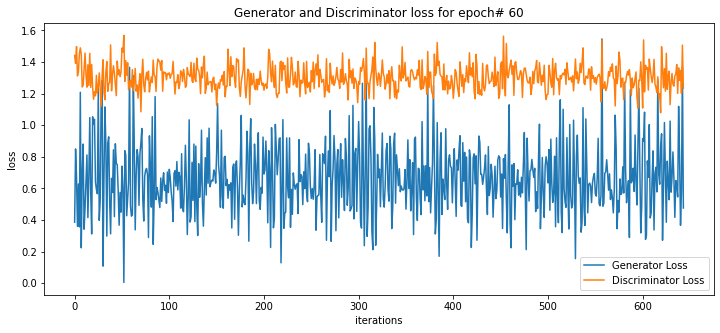

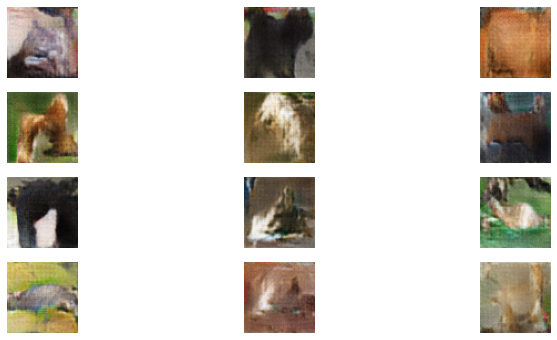

Time for epoch# 60 is 62.62491464614868 sec.
Epoch 62, gen loss = 0.6683726467145896, disc loss = 1.2981352674664919
Time for epoch# 61 is 62.235121965408325 sec.
Epoch 63, gen loss = 0.6734875490055969, disc loss = 1.3008781871440247
Time for epoch# 62 is 62.20888900756836 sec.
Epoch 64, gen loss = 0.6647887637156137, disc loss = 1.3015592051959186
Time for epoch# 63 is 62.61694812774658 sec.
Epoch 65, gen loss = 0.6691337348546208, disc loss = 1.3015141668527022
Time for epoch# 64 is 61.97779107093811 sec.
Epoch 66, gen loss = 0.6725412729942466, disc loss = 1.3027523400620644
Time for epoch# 65 is 61.73122501373291 sec.
Epoch 67, gen loss = 0.6768506478651294, disc loss = 1.3002747984036156
Time for epoch# 66 is 62.03644514083862 sec.
Epoch 68, gen loss = 0.6693781684846936, disc loss = 1.2996246326043739
Time for epoch# 67 is 82.86818408966064 sec.
Epoch 69, gen loss = 0.6768417700833022, disc loss = 1.2994683899494432
Time for epoch# 68 is 61.64558935165405 sec.
Epoch 70, gen loss

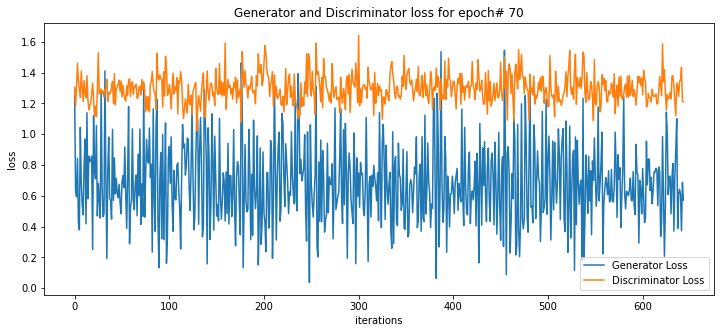

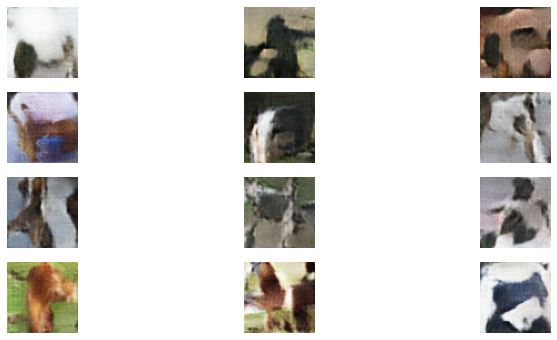

Time for epoch# 70 is 62.86036443710327 sec.
Epoch 72, gen loss = 0.6834863635439495, disc loss = 1.2950508663002749
Time for epoch# 71 is 62.44183278083801 sec.
Epoch 73, gen loss = 0.6844414084345704, disc loss = 1.2957031562091401
Time for epoch# 72 is 62.12500357627869 sec.
Epoch 74, gen loss = 0.6859660308391596, disc loss = 1.2938980841488572
Time for epoch# 73 is 61.73847675323486 sec.
Epoch 75, gen loss = 0.6799327951873312, disc loss = 1.289163869730434
Time for epoch# 74 is 62.324501752853394 sec.
Epoch 76, gen loss = 0.6979681710764674, disc loss = 1.2938864671665689
Time for epoch# 75 is 62.106897830963135 sec.
Epoch 77, gen loss = 0.6914030941122252, disc loss = 1.2949959733841583
Time for epoch# 76 is 62.28230357170105 sec.
Epoch 78, gen loss = 0.6968161370026769, disc loss = 1.2940234901001735
Time for epoch# 77 is 61.94559693336487 sec.
Epoch 79, gen loss = 0.6955026694058631, disc loss = 1.285525463752865
Time for epoch# 78 is 61.5238139629364 sec.
Epoch 80, gen loss =

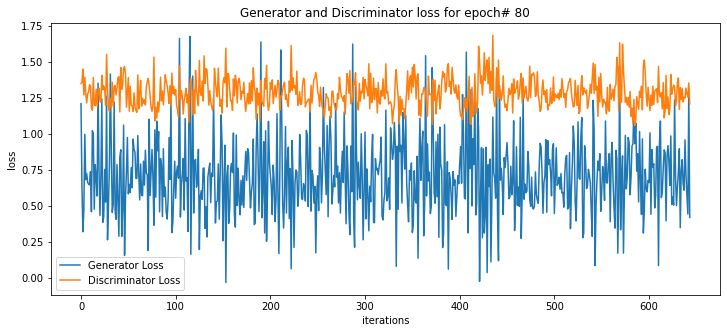

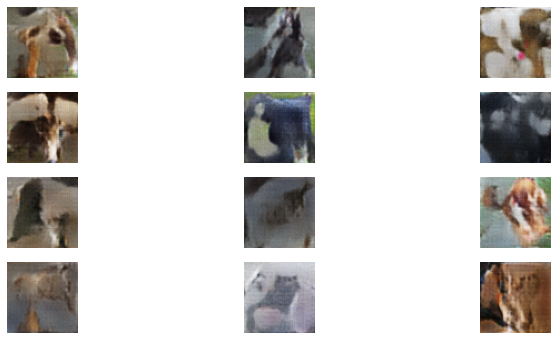

Time for epoch# 80 is 62.55843234062195 sec.
Epoch 82, gen loss = 0.7132151178359083, disc loss = 1.2840654835197496
Time for epoch# 81 is 61.86139130592346 sec.
Epoch 83, gen loss = 0.7015380370980187, disc loss = 1.2874829384110729
Time for epoch# 82 is 61.56102418899536 sec.
Epoch 84, gen loss = 0.711237964712037, disc loss = 1.2915085035821665
Time for epoch# 83 is 61.76071000099182 sec.
Epoch 85, gen loss = 0.7123978242729299, disc loss = 1.2779947761793313
Time for epoch# 84 is 61.57405972480774 sec.
Epoch 86, gen loss = 0.7231120648620338, disc loss = 1.2816401359087193
Time for epoch# 85 is 61.740254402160645 sec.
Epoch 87, gen loss = 0.7422149987422763, disc loss = 1.2819315019231405
Time for epoch# 86 is 61.6469886302948 sec.
Epoch 88, gen loss = 0.7029002512507256, disc loss = 1.2859626007006035
Time for epoch# 87 is 62.008456230163574 sec.
Epoch 89, gen loss = 0.7207439047348055, disc loss = 1.2721608444030241
Time for epoch# 88 is 61.79842567443848 sec.
Epoch 90, gen loss 

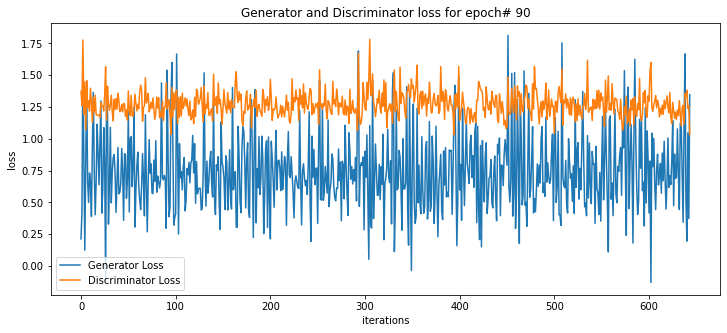

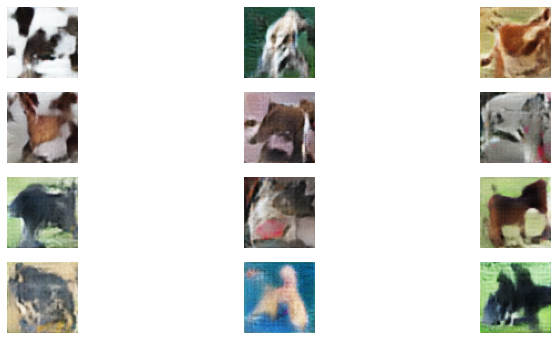

Time for epoch# 90 is 62.69721531867981 sec.
Epoch 92, gen loss = 0.7376141749345553, disc loss = 1.2746942341327667
Time for epoch# 91 is 61.72334122657776 sec.
Epoch 93, gen loss = 0.7513824313393106, disc loss = 1.2633054476717245
Time for epoch# 92 is 61.760958194732666 sec.
Epoch 94, gen loss = 0.7590543335630495, disc loss = 1.2587199196311998
Time for epoch# 93 is 62.132710695266724 sec.
Epoch 95, gen loss = 0.7555876567190432, disc loss = 1.265886278256126
Time for epoch# 94 is 62.04165196418762 sec.
Epoch 96, gen loss = 0.7727083205968511, disc loss = 1.2543979862832135
Time for epoch# 95 is 61.92441415786743 sec.
Epoch 97, gen loss = 0.7693385749314883, disc loss = 1.258562326616382
Time for epoch# 96 is 61.89246582984924 sec.
Epoch 98, gen loss = 0.779202946450168, disc loss = 1.2552410443747266
Time for epoch# 97 is 61.90182685852051 sec.
Epoch 99, gen loss = 0.7884088981063655, disc loss = 1.2475827547333995
Time for epoch# 98 is 61.77294921875 sec.
Epoch 100, gen loss = 0

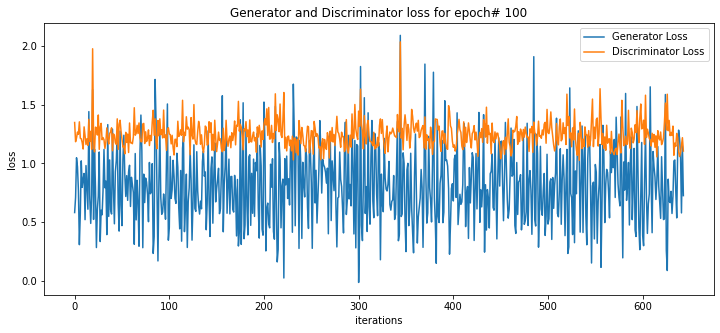

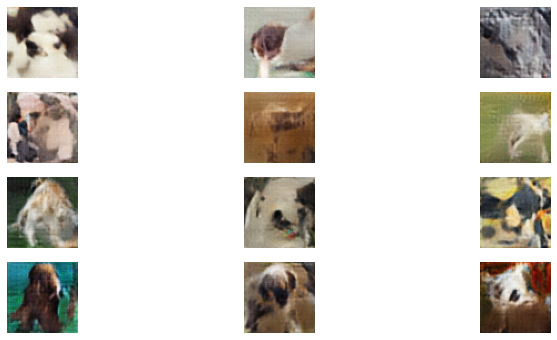

Time for epoch# 100 is 62.04656362533569 sec.
Epoch 102, gen loss = 0.820762290603406, disc loss = 1.245612013969362
Time for epoch# 101 is 61.78700041770935 sec.
Epoch 103, gen loss = 0.8127495105441961, disc loss = 1.2463829709876397
Time for epoch# 102 is 61.4342896938324 sec.
Epoch 104, gen loss = 0.8166065884302862, disc loss = 1.2337543116593213
Time for epoch# 103 is 61.95321273803711 sec.
Epoch 105, gen loss = 0.8421030306193676, disc loss = 1.2286526966169014
Time for epoch# 104 is 61.88242220878601 sec.
Epoch 106, gen loss = 0.8359628488390666, disc loss = 1.2353332194482318
Time for epoch# 105 is 61.71152210235596 sec.
Epoch 107, gen loss = 0.8652074087038057, disc loss = 1.2294790215373779
Time for epoch# 106 is 61.70782494544983 sec.
Epoch 108, gen loss = 0.8452210718106409, disc loss = 1.2316144199474999
Time for epoch# 107 is 62.298760414123535 sec.
Epoch 109, gen loss = 0.8544405042237214, disc loss = 1.2326337928357332
Time for epoch# 108 is 62.29543876647949 sec.
Epoc

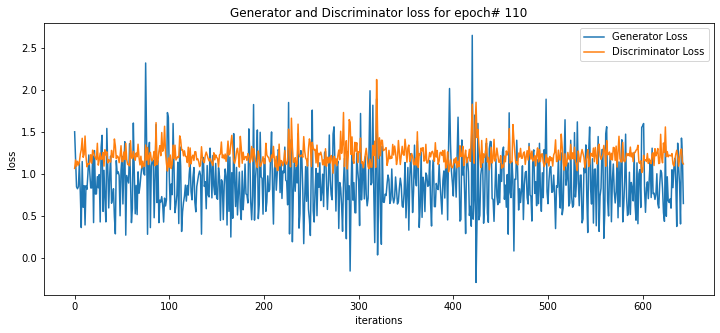

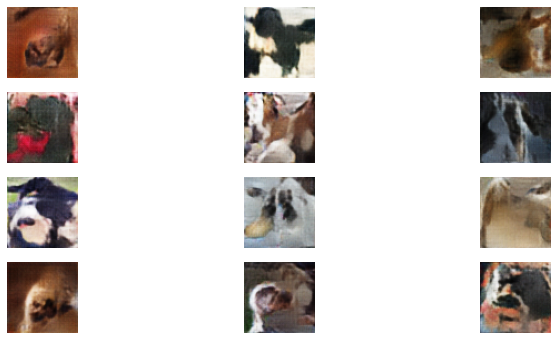

Time for epoch# 110 is 62.29253005981445 sec.
Epoch 112, gen loss = 0.8970415096394486, disc loss = 1.210616419774405
Time for epoch# 111 is 61.83838391304016 sec.
Epoch 113, gen loss = 0.8982850768319939, disc loss = 1.2169459482527667
Time for epoch# 112 is 61.90120053291321 sec.
Epoch 114, gen loss = 0.9092985158323409, disc loss = 1.20958889086054
Time for epoch# 113 is 61.67068910598755 sec.
Epoch 115, gen loss = 0.9247588827231356, disc loss = 1.2092103835958872
Time for epoch# 114 is 61.90374779701233 sec.
Epoch 116, gen loss = 0.8992582954327513, disc loss = 1.2141853837493044
Time for epoch# 115 is 61.69245767593384 sec.
Epoch 117, gen loss = 0.9190554989513403, disc loss = 1.2112086863251206
Time for epoch# 116 is 61.677040815353394 sec.
Epoch 118, gen loss = 0.9323244338496501, disc loss = 1.2056614495582463
Time for epoch# 117 is 61.72622275352478 sec.
Epoch 119, gen loss = 0.928476047279857, disc loss = 1.2071571059478736
Time for epoch# 118 is 62.156373262405396 sec.
Epoc

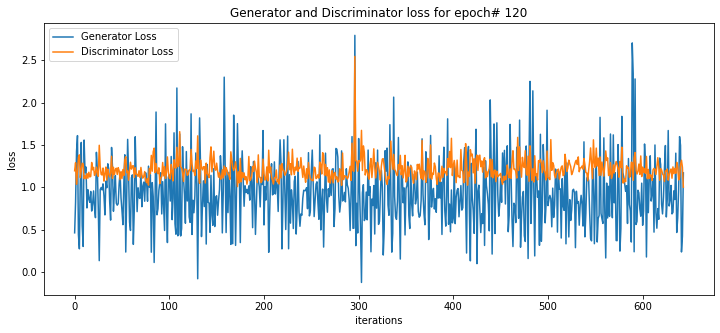

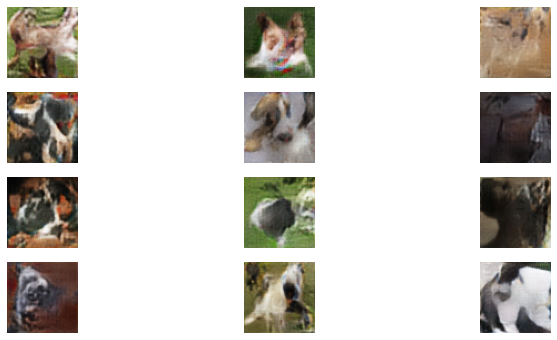

Time for epoch# 120 is 62.58361744880676 sec.
Epoch 122, gen loss = 0.9561715539868759, disc loss = 1.1933619726148452
Time for epoch# 121 is 61.8817241191864 sec.
Epoch 123, gen loss = 0.9672860232823939, disc loss = 1.1932371651163753
Time for epoch# 122 is 61.892383337020874 sec.
Epoch 124, gen loss = 0.957169841468097, disc loss = 1.2010215746690027
Time for epoch# 123 is 61.898791790008545 sec.
Epoch 125, gen loss = 0.9571144442097139, disc loss = 1.198100341402966
Time for epoch# 124 is 61.719748735427856 sec.
Epoch 126, gen loss = 0.966956844577936, disc loss = 1.1958120370873753
Time for epoch# 125 is 61.52167320251465 sec.
Epoch 127, gen loss = 0.9766566485140519, disc loss = 1.1891191833137726
Time for epoch# 126 is 61.92871856689453 sec.
Epoch 128, gen loss = 0.9890887550431193, disc loss = 1.1882998176057886
Time for epoch# 127 is 61.38095736503601 sec.
Epoch 129, gen loss = 0.98555136617759, disc loss = 1.194947730310215
Time for epoch# 128 is 61.710779905319214 sec.
Epoch

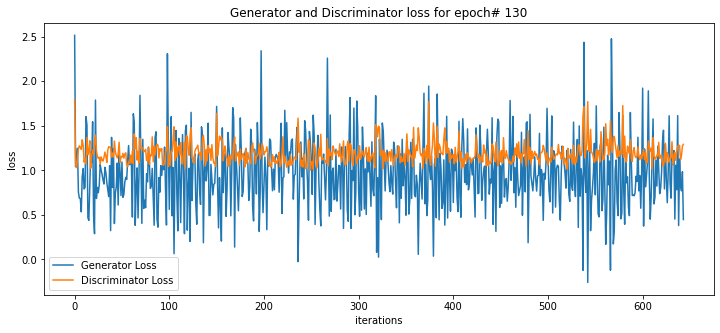

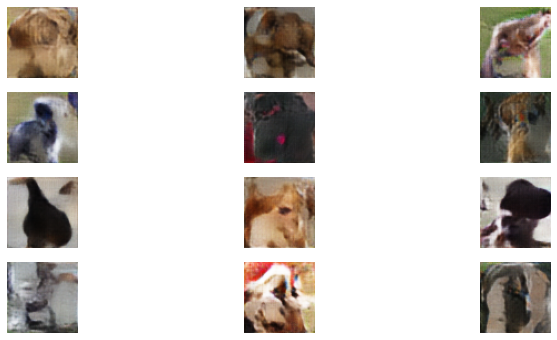

Time for epoch# 130 is 62.195045948028564 sec.
Epoch 132, gen loss = 0.9873583297482373, disc loss = 1.1857264869331574
Time for epoch# 131 is 61.67529773712158 sec.
Epoch 133, gen loss = 1.0071469653999399, disc loss = 1.1840176356505163
Time for epoch# 132 is 62.34144353866577 sec.
Epoch 134, gen loss = 1.0084208772511956, disc loss = 1.1785166067366275
Time for epoch# 133 is 61.769694089889526 sec.
Epoch 135, gen loss = 1.0188366172239416, disc loss = 1.17973616404563
Time for epoch# 134 is 82.87647581100464 sec.
Epoch 136, gen loss = 1.011743349237194, disc loss = 1.1840384900569916
Time for epoch# 135 is 62.17298126220703 sec.
Epoch 137, gen loss = 1.0149326549079385, disc loss = 1.1780190952816365
Time for epoch# 136 is 62.377055168151855 sec.
Epoch 138, gen loss = 1.0367118815388183, disc loss = 1.1753859602331376
Time for epoch# 137 is 61.77222394943237 sec.
Epoch 139, gen loss = 1.01261553087023, disc loss = 1.1788288488151124
Time for epoch# 138 is 62.03556418418884 sec.
Epoc

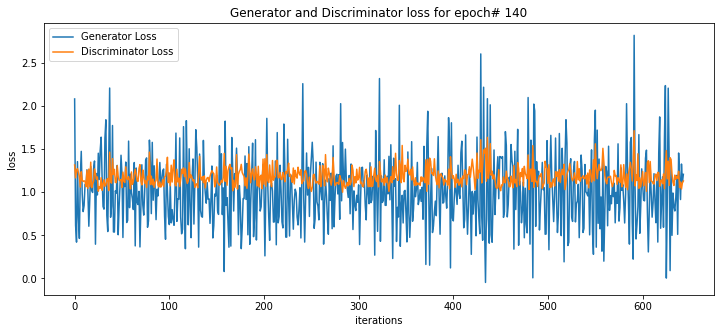

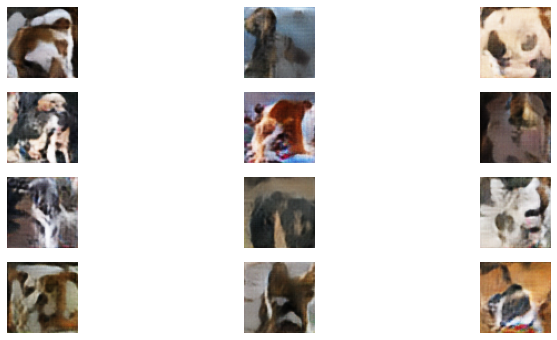

Time for epoch# 140 is 63.02415943145752 sec.
Epoch 142, gen loss = 1.0307822288563533, disc loss = 1.1732766144209026
Time for epoch# 141 is 62.37469816207886 sec.
Epoch 143, gen loss = 1.0472451665189972, disc loss = 1.1729694157838821
Time for epoch# 142 is 62.28550744056702 sec.
Epoch 144, gen loss = 1.0422475559619597, disc loss = 1.16839779756084
Time for epoch# 143 is 61.97868490219116 sec.
Epoch 145, gen loss = 1.0497425652184287, disc loss = 1.1691250106007416
Time for epoch# 144 is 62.00578761100769 sec.
Epoch 146, gen loss = 1.0516140575561186, disc loss = 1.169638135603496
Time for epoch# 145 is 62.23616981506348 sec.
Epoch 147, gen loss = 1.0379416730301165, disc loss = 1.168347206637726
Time for epoch# 146 is 62.68249702453613 sec.
Epoch 148, gen loss = 1.0648697923973018, disc loss = 1.1700681921858225
Time for epoch# 147 is 62.4005560874939 sec.
Epoch 149, gen loss = 1.043650423766617, disc loss = 1.1677907951500104
Time for epoch# 148 is 62.26553249359131 sec.
Epoch 15

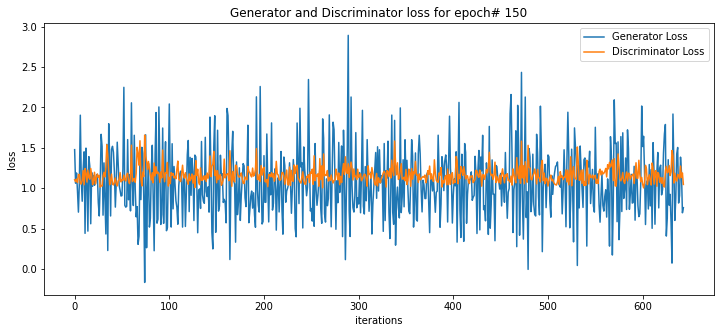

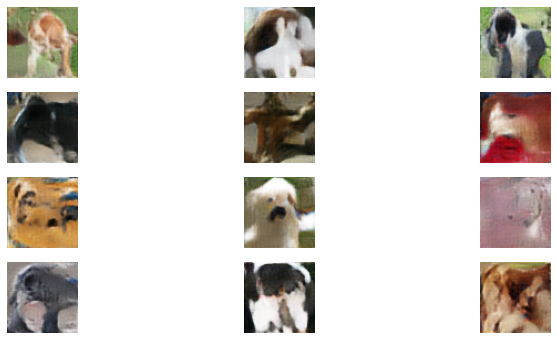

Time for epoch# 150 is 62.68779182434082 sec.
Epoch 152, gen loss = 1.0485845291292908, disc loss = 1.1712032813833366
Time for epoch# 151 is 62.176411151885986 sec.
Epoch 153, gen loss = 1.0842296431312535, disc loss = 1.158919963499774
Time for epoch# 152 is 62.08303618431091 sec.
Epoch 154, gen loss = 1.0955221682601834, disc loss = 1.1596186298946416
Time for epoch# 153 is 62.45920395851135 sec.
Epoch 155, gen loss = 1.0896839393036706, disc loss = 1.160732886713484
Time for epoch# 154 is 62.64754009246826 sec.
Epoch 156, gen loss = 1.063382905682329, disc loss = 1.1635408884620073
Time for epoch# 155 is 62.23468255996704 sec.
Epoch 157, gen loss = 1.0966468101240092, disc loss = 1.155181115828686
Time for epoch# 156 is 62.79471969604492 sec.
Epoch 158, gen loss = 1.0783644452320864, disc loss = 1.1634413584233811
Time for epoch# 157 is 62.59574913978577 sec.
Epoch 159, gen loss = 1.0884243161272928, disc loss = 1.1559343373183137
Time for epoch# 158 is 62.47351908683777 sec.
Epoch

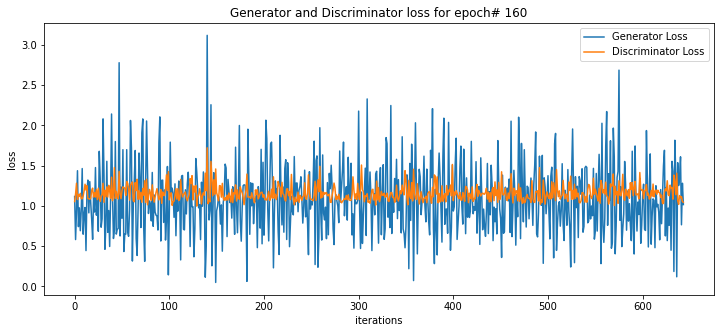

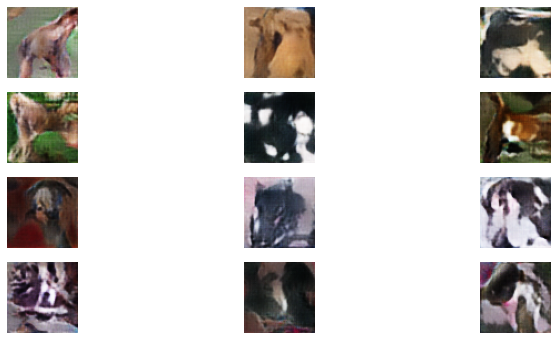

Time for epoch# 160 is 63.41417145729065 sec.
Epoch 162, gen loss = 1.0901570912169998, disc loss = 1.1535530921465122
Time for epoch# 161 is 62.27178454399109 sec.
Epoch 163, gen loss = 1.0997355918816483, disc loss = 1.154433594727368
Time for epoch# 162 is 62.77323913574219 sec.
Epoch 164, gen loss = 1.093857471680743, disc loss = 1.153914766837351
Time for epoch# 163 is 62.46609973907471 sec.
Epoch 165, gen loss = 1.1143834654947522, disc loss = 1.1474021837022734
Time for epoch# 164 is 62.53787159919739 sec.
Epoch 166, gen loss = 1.1120018498995197, disc loss = 1.1554054708584496
Time for epoch# 165 is 62.6353223323822 sec.
Epoch 167, gen loss = 1.0822344334992748, disc loss = 1.157569266254117
Time for epoch# 166 is 62.325074672698975 sec.
Epoch 168, gen loss = 1.1182121715641447, disc loss = 1.150750266654151
Time for epoch# 167 is 62.66814208030701 sec.
Epoch 169, gen loss = 1.1028152439535035, disc loss = 1.1551210301818315
Time for epoch# 168 is 62.65911364555359 sec.
Epoch 1

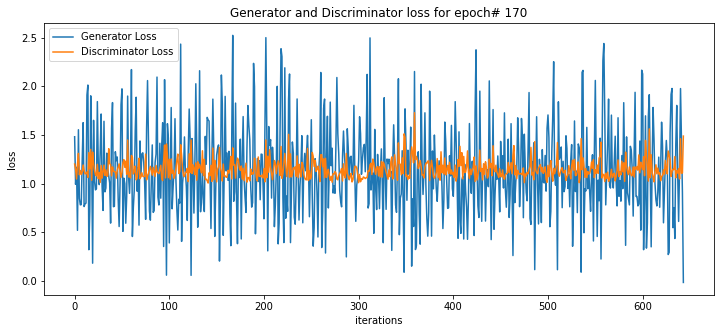

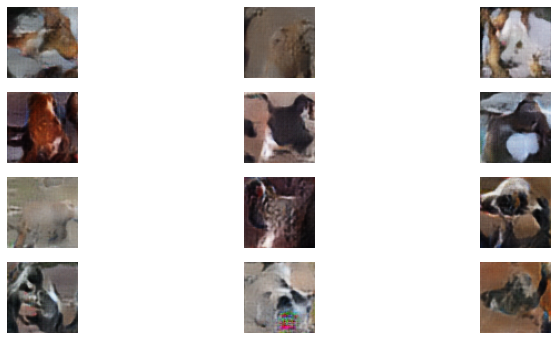

Time for epoch# 170 is 63.509273529052734 sec.
Epoch 172, gen loss = 1.1289592040182086, disc loss = 1.1498774136445538
Time for epoch# 171 is 62.62092661857605 sec.
Epoch 173, gen loss = 1.1231805922012337, disc loss = 1.147571662753265
Time for epoch# 172 is 62.5604612827301 sec.
Epoch 174, gen loss = 1.1154989424792137, disc loss = 1.1457211701951413
Time for epoch# 173 is 62.785516023635864 sec.
Epoch 175, gen loss = 1.1257421966780972, disc loss = 1.1442282895864166
Time for epoch# 174 is 62.407668113708496 sec.
Epoch 176, gen loss = 1.1440901440446791, disc loss = 1.1421431530706632
Time for epoch# 175 is 62.485814571380615 sec.
Epoch 177, gen loss = 1.043153683059149, disc loss = 1.1740412738012231
Time for epoch# 176 is 62.80978798866272 sec.
Epoch 178, gen loss = 1.137588404659876, disc loss = 1.14518033375281
Time for epoch# 177 is 82.85413885116577 sec.
Epoch 179, gen loss = 1.106866397044581, disc loss = 1.1537098292238224
Time for epoch# 178 is 62.57094216346741 sec.
Epoch

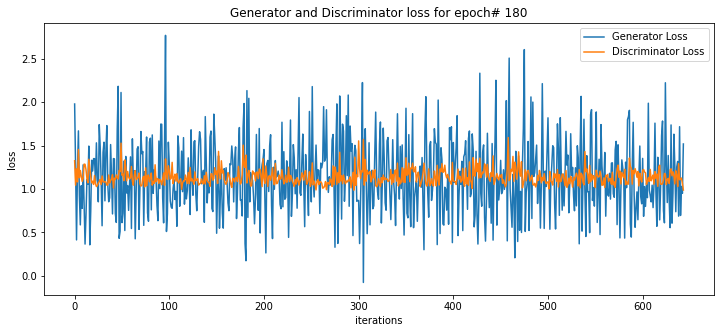

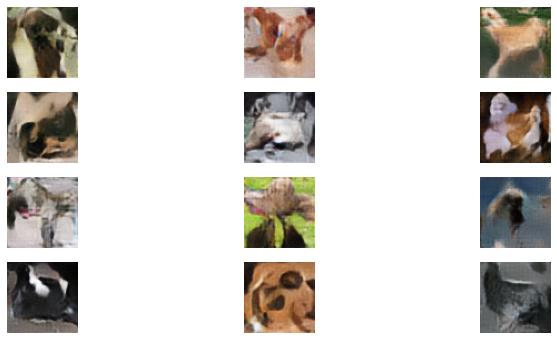

Time for epoch# 180 is 63.53489851951599 sec.
Epoch 182, gen loss = 1.0882314198841312, disc loss = 1.1560162984251237
Time for epoch# 181 is 62.761518239974976 sec.
Epoch 183, gen loss = 1.1309963394670823, disc loss = 1.1437241787680927
Time for epoch# 182 is 62.84357166290283 sec.
Epoch 184, gen loss = 1.1459456646167065, disc loss = 1.1458423132111568
Time for epoch# 183 is 62.81930065155029 sec.
Epoch 185, gen loss = 1.1415030003774056, disc loss = 1.1382654290762007
Time for epoch# 184 is 62.28192090988159 sec.
Epoch 186, gen loss = 1.1527535135377638, disc loss = 1.1345601981471043
Time for epoch# 185 is 62.45123815536499 sec.
Epoch 187, gen loss = 1.1318568506145052, disc loss = 1.1428523752259911
Time for epoch# 186 is 62.58372783660889 sec.
Epoch 188, gen loss = 1.1496072189986521, disc loss = 1.135035516127296
Time for epoch# 187 is 62.374202251434326 sec.
Epoch 189, gen loss = 1.1381665920804005, disc loss = 1.1459264795972695
Time for epoch# 188 is 62.64356780052185 sec.
E

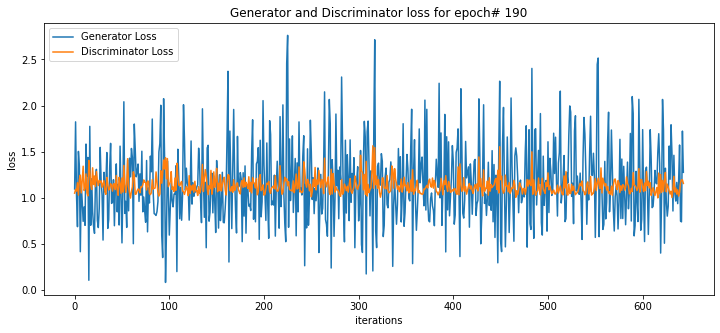

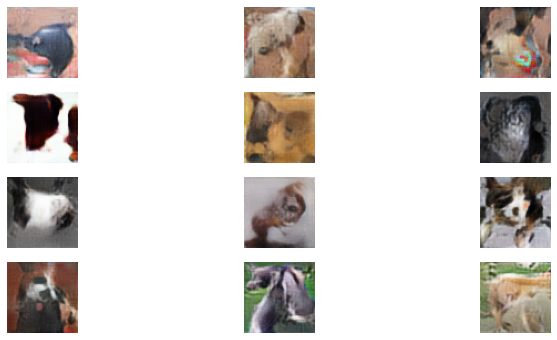

Time for epoch# 190 is 63.200509548187256 sec.
Epoch 192, gen loss = 1.1411485566803896, disc loss = 1.1442016200249239
Time for epoch# 191 is 62.73404335975647 sec.
Epoch 193, gen loss = 1.151059151841154, disc loss = 1.1372519487179584
Time for epoch# 192 is 62.30781412124634 sec.
Epoch 194, gen loss = 1.164583725982016, disc loss = 1.139538921276975
Time for epoch# 193 is 62.273760080337524 sec.
Epoch 195, gen loss = 1.1452698105055352, disc loss = 1.1384478851875164
Time for epoch# 194 is 62.534339904785156 sec.
Epoch 196, gen loss = 1.16712151872723, disc loss = 1.1365037701144722
Time for epoch# 195 is 62.601966857910156 sec.
Epoch 197, gen loss = 1.1464468282849893, disc loss = 1.139902058132687
Time for epoch# 196 is 62.36822557449341 sec.
Epoch 198, gen loss = 1.1621109786217811, disc loss = 1.127132288695122
Time for epoch# 197 is 62.16761922836304 sec.
Epoch 199, gen loss = 1.1579306680847954, disc loss = 1.1416522207097237
Time for epoch# 198 is 62.337740659713745 sec.
Epoc

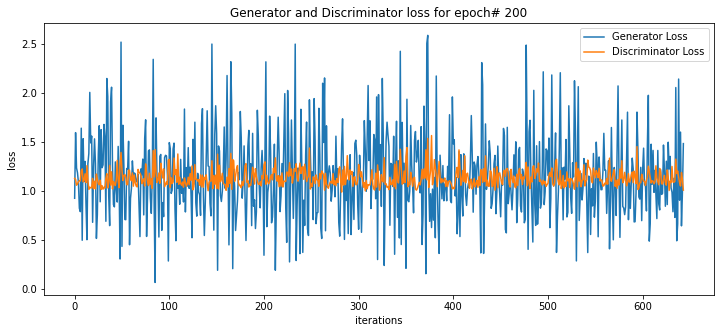

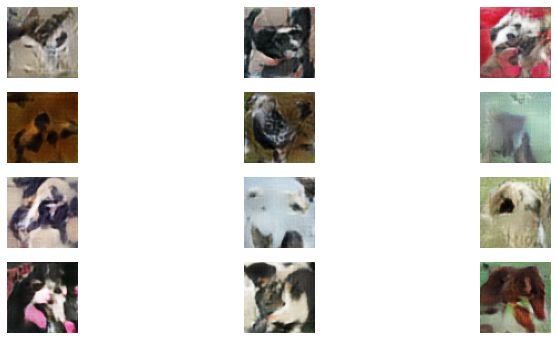

Time for epoch# 200 is 63.49010968208313 sec.
Epoch 202, gen loss = 1.1819350582935055, disc loss = 1.128053044587929
Time for epoch# 201 is 62.92683696746826 sec.
Epoch 203, gen loss = 1.1749360988969388, disc loss = 1.126968502998352
Time for epoch# 202 is 82.94159770011902 sec.
Epoch 204, gen loss = 1.1759334164440216, disc loss = 1.1394666518483842
Time for epoch# 203 is 62.57832884788513 sec.
Epoch 205, gen loss = 1.1527359838950337, disc loss = 1.1367200092869516
Time for epoch# 204 is 62.51241970062256 sec.
Epoch 206, gen loss = 1.172736153595138, disc loss = 1.1296323173164582
Time for epoch# 205 is 62.33068227767944 sec.
Epoch 207, gen loss = 1.1656688765408645, disc loss = 1.1294630935288363
Time for epoch# 206 is 62.85019659996033 sec.
Epoch 208, gen loss = 1.1780202481432915, disc loss = 1.1254287669377296
Time for epoch# 207 is 62.57521367073059 sec.
Epoch 209, gen loss = 1.174617823158385, disc loss = 1.1340009439620913
Time for epoch# 208 is 62.698455572128296 sec.
Epoch

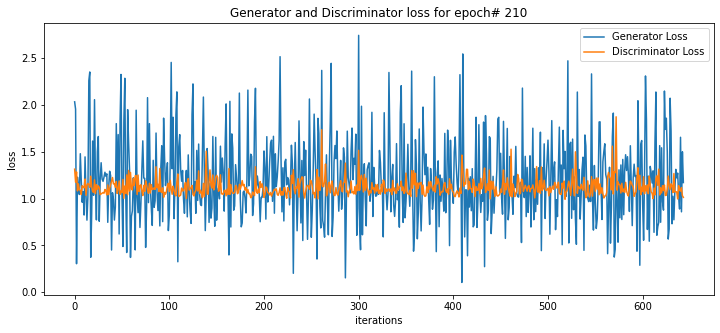

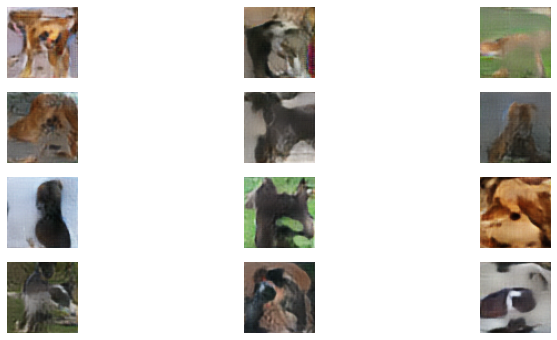

Time for epoch# 210 is 63.09255766868591 sec.
Epoch 212, gen loss = 1.1906558269669552, disc loss = 1.1268694139785649
Time for epoch# 211 is 62.64357662200928 sec.
Epoch 213, gen loss = 1.1806257882600892, disc loss = 1.1331371948215532
Time for epoch# 212 is 62.58644962310791 sec.
Epoch 214, gen loss = 1.1723726565128203, disc loss = 1.1346394582564787
Time for epoch# 213 is 62.63386654853821 sec.
Epoch 215, gen loss = 1.1952392922378845, disc loss = 1.1246227336040935
Time for epoch# 214 is 62.87683701515198 sec.
Epoch 216, gen loss = 1.192643555656353, disc loss = 1.1276255079678126
Time for epoch# 215 is 62.36591625213623 sec.
Epoch 217, gen loss = 1.1774232846320323, disc loss = 1.1270077467334936
Time for epoch# 216 is 62.51394176483154 sec.
Epoch 218, gen loss = 1.1927021159992919, disc loss = 1.127006456163359
Time for epoch# 217 is 62.8326678276062 sec.
Epoch 219, gen loss = 1.1798651563784581, disc loss = 1.130975499193861
Time for epoch# 218 is 62.59074020385742 sec.
Epoch 

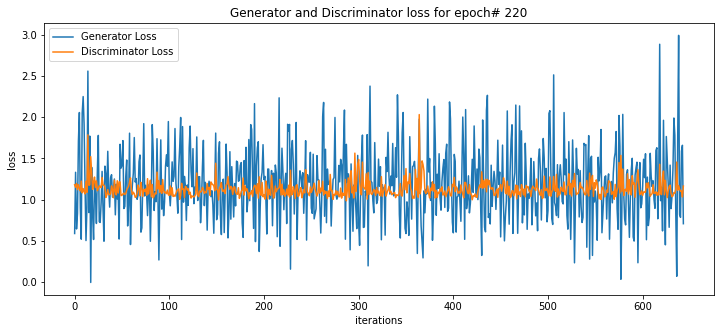

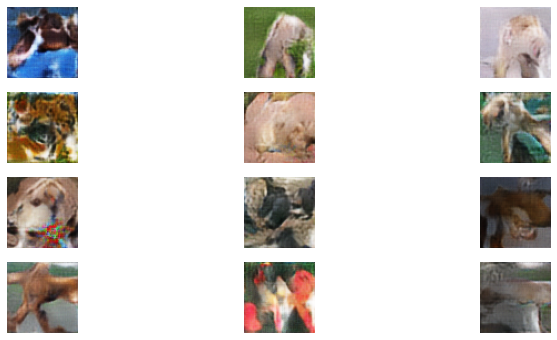

Time for epoch# 220 is 63.34014844894409 sec.
Epoch 222, gen loss = 1.1712565978827036, disc loss = 1.1308574807014524
Time for epoch# 221 is 62.6106653213501 sec.
Epoch 223, gen loss = 1.2120663596907202, disc loss = 1.1197223045070719
Time for epoch# 222 is 62.56864857673645 sec.
Epoch 224, gen loss = 1.1915679219531716, disc loss = 1.1248612838872472
Time for epoch# 223 is 62.64388704299927 sec.
Epoch 225, gen loss = 1.1952214806820758, disc loss = 1.1211281505800923
Time for epoch# 224 is 62.895320892333984 sec.
Epoch 226, gen loss = 1.1963224524606066, disc loss = 1.1313416534884375
Time for epoch# 225 is 62.36453723907471 sec.
Epoch 227, gen loss = 1.2052977330959547, disc loss = 1.1240431119381271
Time for epoch# 226 is 62.47651219367981 sec.
Epoch 228, gen loss = 1.2058379620498751, disc loss = 1.1169537197543968
Time for epoch# 227 is 62.87742567062378 sec.
Epoch 229, gen loss = 1.2134683151260852, disc loss = 1.1185260314193572
Time for epoch# 228 is 62.2738893032074 sec.
Epo

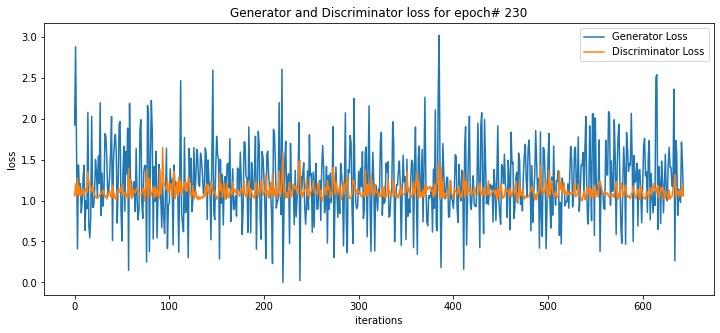

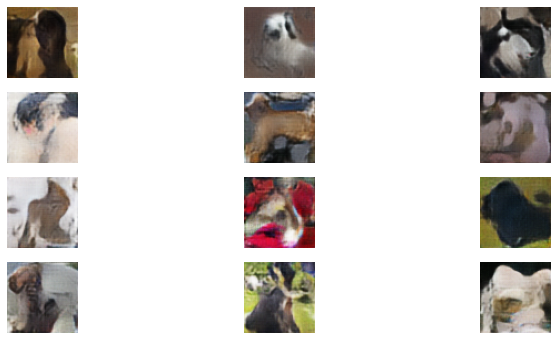

Time for epoch# 230 is 63.241055727005005 sec.
Epoch 232, gen loss = 1.1890415728948316, disc loss = 1.123775527343987
Time for epoch# 231 is 62.7187922000885 sec.
Epoch 233, gen loss = 1.1963755423260958, disc loss = 1.1212146483963321
Time for epoch# 232 is 62.50716686248779 sec.
Epoch 234, gen loss = 1.2030794496578598, disc loss = 1.1256507944246257
Time for epoch# 233 is 62.49789237976074 sec.
Epoch 235, gen loss = 1.2304211860025152, disc loss = 1.114559090655783
Time for epoch# 234 is 62.512417793273926 sec.
Epoch 236, gen loss = 1.2198716310656958, disc loss = 1.1132484604112851
Time for epoch# 235 is 62.33594489097595 sec.
Epoch 237, gen loss = 1.188903248400329, disc loss = 1.1235993411970435
Time for epoch# 236 is 62.52587556838989 sec.
Epoch 238, gen loss = 1.2128556387626237, disc loss = 1.1206885050542605
Time for epoch# 237 is 62.29842782020569 sec.
Epoch 239, gen loss = 1.2275405728854007, disc loss = 1.1125583729203443
Time for epoch# 238 is 62.083627462387085 sec.
Epo

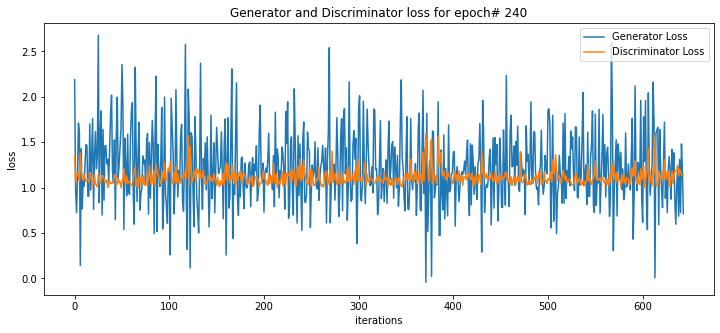

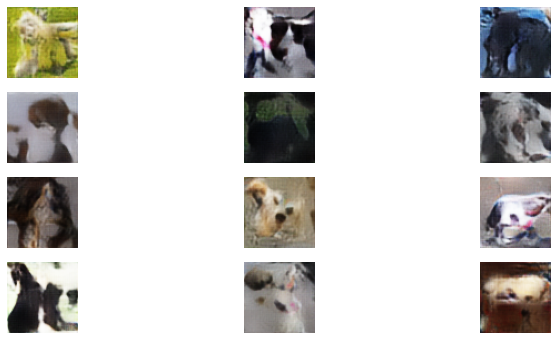

Time for epoch# 240 is 63.36399722099304 sec.
Epoch 242, gen loss = 1.2234949756483113, disc loss = 1.1160213706656272
Time for epoch# 241 is 62.355143547058105 sec.
Epoch 243, gen loss = 1.2141608497278291, disc loss = 1.125654213176751
Time for epoch# 242 is 62.74269413948059 sec.
Epoch 244, gen loss = 1.2175470874558048, disc loss = 1.1163686728625564
Time for epoch# 243 is 62.34947681427002 sec.
Epoch 245, gen loss = 1.2253255227939313, disc loss = 1.11569650239826
Time for epoch# 244 is 62.42169213294983 sec.
Epoch 246, gen loss = 1.2203641777499492, disc loss = 1.1167727632922415
Time for epoch# 245 is 62.56545853614807 sec.
Epoch 247, gen loss = 1.1950495711626103, disc loss = 1.1214646545256146
Time for epoch# 246 is 62.3110830783844 sec.
Epoch 248, gen loss = 1.2168711906310565, disc loss = 1.112173056750564
Time for epoch# 247 is 62.237961530685425 sec.
Epoch 249, gen loss = 1.221310378474571, disc loss = 1.1156596487723522
Time for epoch# 248 is 62.64517116546631 sec.
Epoch 

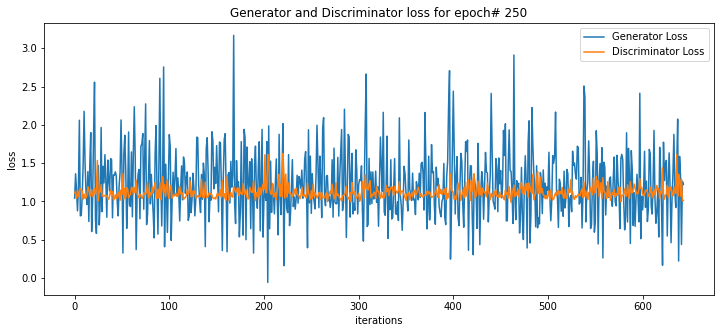

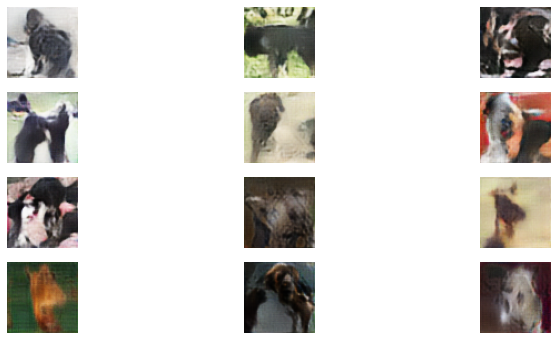

Time for epoch# 250 is 63.085286378860474 sec.
Epoch 252, gen loss = 1.214890380945311, disc loss = 1.115549416830821
Time for epoch# 251 is 62.73006057739258 sec.
Epoch 253, gen loss = 1.2277322187759445, disc loss = 1.1084456640926208
Time for epoch# 252 is 62.34280228614807 sec.
Epoch 254, gen loss = 1.2284180155914763, disc loss = 1.1166343728762975
Time for epoch# 253 is 82.88339185714722 sec.
Epoch 255, gen loss = 1.2091853202476819, disc loss = 1.117556200079296
Time for epoch# 254 is 62.69995188713074 sec.
Epoch 256, gen loss = 1.2394499736172813, disc loss = 1.1046766934002408
Time for epoch# 255 is 62.296573877334595 sec.
Epoch 257, gen loss = 1.2116081887430956, disc loss = 1.120997309499646
Time for epoch# 256 is 62.370904207229614 sec.
Epoch 258, gen loss = 1.228444256330985, disc loss = 1.120009447384325
Time for epoch# 257 is 62.407865047454834 sec.
Epoch 259, gen loss = 1.2369118261249354, disc loss = 1.1113728901244098
Time for epoch# 258 is 62.27681803703308 sec.
Epoc

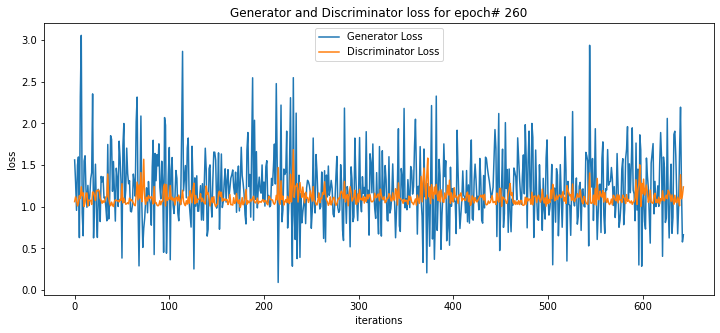

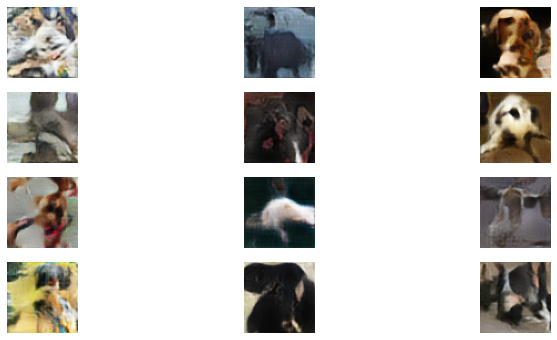

Time for epoch# 260 is 63.207420349121094 sec.
Epoch 262, gen loss = 1.233987323682385, disc loss = 1.1064469942950315
Time for epoch# 261 is 62.16134238243103 sec.
Epoch 263, gen loss = 1.2361768548209104, disc loss = 1.1136631267781583
Time for epoch# 262 is 82.94935059547424 sec.
Epoch 264, gen loss = 1.2297148278087193, disc loss = 1.109976988031257
Time for epoch# 263 is 62.64588522911072 sec.
Epoch 265, gen loss = 1.2549810871967804, disc loss = 1.1036707697817998
Time for epoch# 264 is 62.389325857162476 sec.
Epoch 266, gen loss = 1.216321835618304, disc loss = 1.1166180698027521
Time for epoch# 265 is 62.1693320274353 sec.
Epoch 267, gen loss = 1.2634485540911555, disc loss = 1.1020463394082112
Time for epoch# 266 is 82.85461330413818 sec.
Epoch 268, gen loss = 1.2333685894791755, disc loss = 1.1155359886632943
Time for epoch# 267 is 62.21816372871399 sec.
Epoch 269, gen loss = 1.2445946331974698, disc loss = 1.10377667076099
Time for epoch# 268 is 62.217376947402954 sec.
Epoch

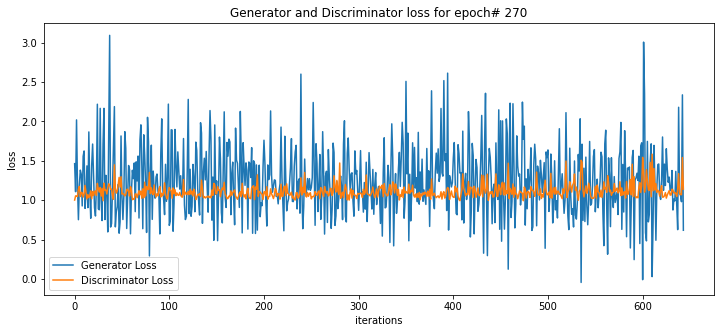

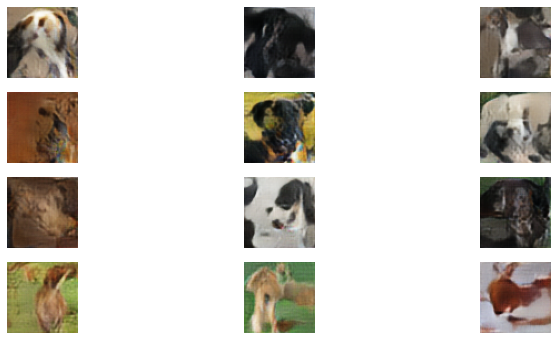

Time for epoch# 270 is 83.70930624008179 sec.
Epoch 272, gen loss = 1.2262285774955468, disc loss = 1.1067672120117993
Time for epoch# 271 is 62.44200873374939 sec.
Epoch 273, gen loss = 1.263568189411615, disc loss = 1.1049319877757788
Time for epoch# 272 is 62.330907344818115 sec.
Epoch 274, gen loss = 1.2450002827305602, disc loss = 1.1067058520842783
Time for epoch# 273 is 62.41281270980835 sec.
Epoch 275, gen loss = 1.2586958937344044, disc loss = 1.1035904281813165
Time for epoch# 274 is 62.315065145492554 sec.
Epoch 276, gen loss = 1.2419678728553172, disc loss = 1.1042799926507547
Time for epoch# 275 is 61.96050143241882 sec.
Epoch 277, gen loss = 1.2439424533003605, disc loss = 1.1058975869083998
Time for epoch# 276 is 62.14530920982361 sec.
Epoch 278, gen loss = 1.2498834180582015, disc loss = 1.1063138547336093
Time for epoch# 277 is 62.11079788208008 sec.
Epoch 279, gen loss = 1.2557436964410988, disc loss = 1.10482229810694
Time for epoch# 278 is 62.21507692337036 sec.
Epo

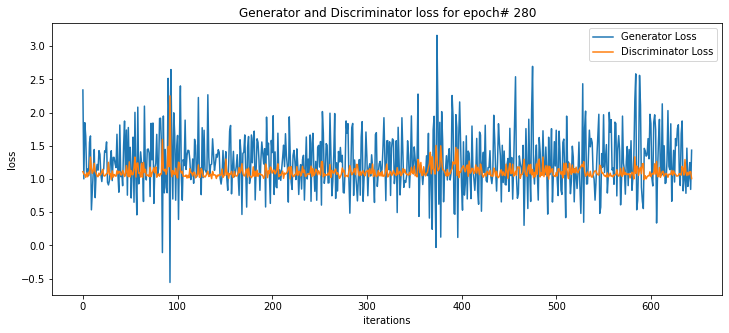

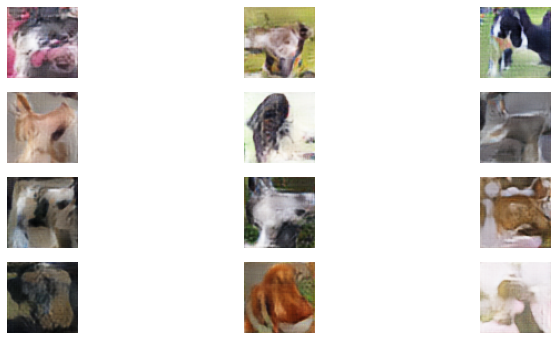

Time for epoch# 280 is 63.04235768318176 sec.
Epoch 282, gen loss = 1.2581299019757635, disc loss = 1.101126252216582
Time for epoch# 281 is 62.0849974155426 sec.
Epoch 283, gen loss = 1.255610476832212, disc loss = 1.1037127482039588
Time for epoch# 282 is 62.132232427597046 sec.
Epoch 284, gen loss = 1.2514796488403535, disc loss = 1.1019515525665342
Time for epoch# 283 is 62.385976791381836 sec.
Epoch 285, gen loss = 1.2529898449686003, disc loss = 1.1040765801386803
Time for epoch# 284 is 62.07880902290344 sec.
Epoch 286, gen loss = 1.2458378211681886, disc loss = 1.1091065640034883
Time for epoch# 285 is 62.09382104873657 sec.
Epoch 287, gen loss = 1.2570491273488318, disc loss = 1.1052026817147036
Time for epoch# 286 is 62.182127237319946 sec.
Epoch 288, gen loss = 1.258766468822586, disc loss = 1.0995488355618825
Time for epoch# 287 is 62.3936026096344 sec.
Epoch 289, gen loss = 1.2452511766300716, disc loss = 1.1088100915184673
Time for epoch# 288 is 61.944026708602905 sec.
Epo

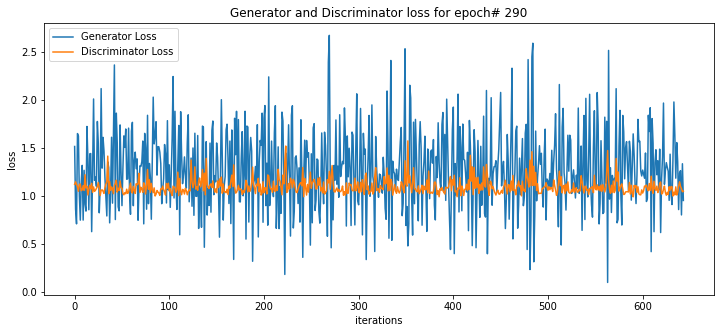

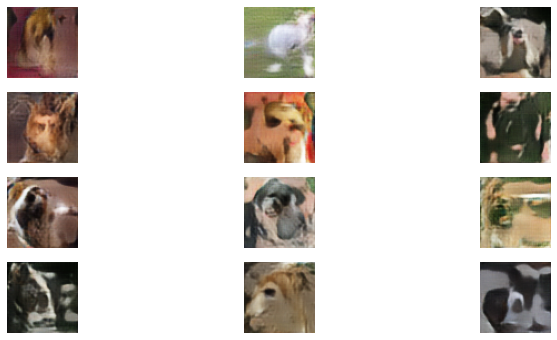

Time for epoch# 290 is 63.017147064208984 sec.
Epoch 292, gen loss = 1.261323037123458, disc loss = 1.0985974866596069
Time for epoch# 291 is 62.19325351715088 sec.
Epoch 293, gen loss = 1.264406307849177, disc loss = 1.103585336611878
Time for epoch# 292 is 62.455140590667725 sec.
Epoch 294, gen loss = 1.252416436277006, disc loss = 1.0978436010039372
Time for epoch# 293 is 62.134684801101685 sec.
Epoch 295, gen loss = 1.2619649978898326, disc loss = 1.0986345669497615
Time for epoch# 294 is 62.47396206855774 sec.
Epoch 296, gen loss = 1.2739750504586267, disc loss = 1.096743215870413
Time for epoch# 295 is 62.57825946807861 sec.
Epoch 297, gen loss = 1.2549826925076684, disc loss = 1.1064797784230724
Time for epoch# 296 is 62.322444438934326 sec.
Epoch 298, gen loss = 1.255645062010851, disc loss = 1.099421514302307
Time for epoch# 297 is 62.42962908744812 sec.
Epoch 299, gen loss = 1.2812180409890523, disc loss = 1.0999598335590421
Time for epoch# 298 is 62.603973388671875 sec.
Epoc

In [25]:
epochs = 300

start = time.time()
train_GAN(data, epochs)
end = time.time()

print('It took {0:1.2f} seconds to train the GAN model.'.format(end-start))

In [36]:
## saving the generator for future use
generator.save('dog_generator.h5')

## Generate IMAGES of Dogs

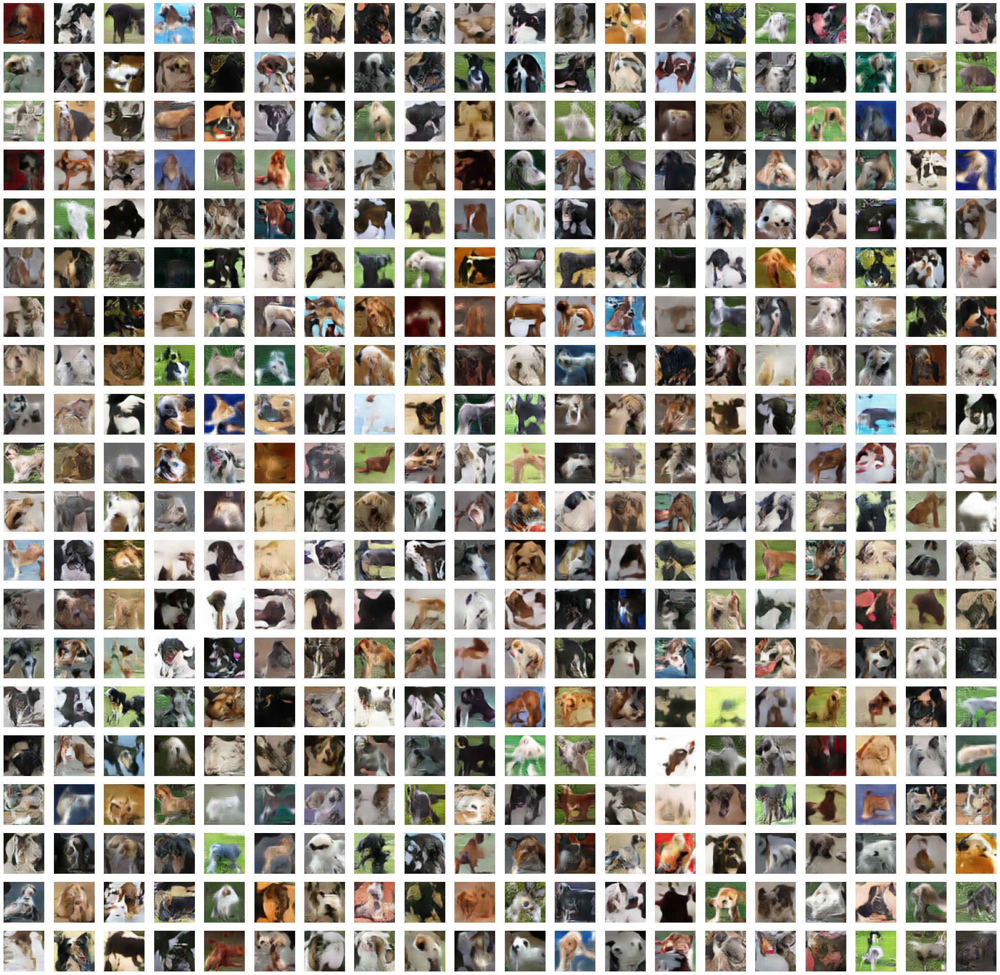

In [35]:
n = 400
test_input = tf.random.normal([n,noise_dim])
img_preds = generator(test_input, training=False)
plt.figure(figsize=(35,35))
for i in range(n):
    plt.subplot(20,20,i+1)
    img = (img_preds[i].numpy()*127.5)+127.5
    plt.imshow(img.astype('uint8'))
    plt.axis('off')
plt.show() 